## algorithm design and anlysis-2025 spring  homework 4
**Deadline**：2025.5.14

**name**:斯宇


note：
---
1. 带有\*的题目，申请免上课的同学，必须完成，其他同学选作；
2. 请独立完成，如求助了他人或者大模型，请著明，并且不可省略算法分析部分；
4. 如若作答有雷同，全部取消成绩；
3. 需要书面作答的题目，可以通过引用图片的形式添加，但是注意上传项目时包含所引用的图片的源文件；
4. $log_n$ 默认表示$log_2{n}$;

## 问题 1 
**最小生成树（Minimum Spanning Tree）**

设  **G**  为一个带权重的连通无向图，且所有边的权重均不相等。令$e_i$ 为权重第 $i$ 小的边。最小生成树（MST）是否必须包含 $e_1$ ? 同理，是否必须包含 $e_2$ 和 $e_3$ ? 若必须包含，请给出证明；否则，请构造反例。需从基本原理论证，不能依赖割引理(cut lemma) 或 Prim/Kruskal算法的正确性。


answer:

### 证明MST必须包含e1：反证法

设G=(V, E)是一个带权重的连通无向图，其中V是顶点集，E是边集，e1是权重最小的边，令e1 ={u, v}，即e1 连接顶点u与v。

假设存在G的一棵最小生成树 T=(V, ET) 不包含e1。

因为T是连通的生成树，所以在T中，顶点u 和v必然是连通的，并且一定是间接联通（因为生成树的定义要求连接图中的所有顶点）。

那么在T中必然存在一条从u到v的路径 P，这条路径P是由T中的若干条边组成的，设路径 P上有一条边 e'(e'属于 ET且e'一定不等于e1)。

由于图G中所有边的权重均不相等，且e1是权重最小的边，所以 e1的权重小于e'

现在我们对最小生成树 T 进行调整：将边 e' 从 T 中删除，然后加入边 e1。

1. **连通性保持**：在T中删除边 e'后，图T会被分成两个不连通的子图（因为树中任意一条边都是桥，删除后会使图不连通），但是加入边e1后，由于e1

连接的正是被e'分割开的两个子图中的顶点u和v，所以新的图依然是连通的。

2. **无环性保持**：因为T是树，删除一条边 e'后不会形成环，再加入一条边 e1 也不会形成环(如果加入e1形成了环，那么说明在删除 e'之前，T 中就已

经存在包含e'和e1 的环，这与 T是树矛盾)，所以新的图仍然是无环的。

3. **边数不变**：原来T作为生成树，边数为|V| - 1（生成树的边数等于顶点数减 1），删除一条边 e'并加入一条边e_1后，边的数量依然是 |V| - 1。

综上，新的图满足生成树的定义（连通、无环且边数为|V| - 1）。

而新生成树的权重 w(T') = w(T) - w(e') + w(e1)，因为 w(e_1) < w(e')，所以 w(T') < w(T)。

这与T是最小生成树（权重最小的生成树）的假设矛盾。

所以，假设不成立，即最小生成树（MST）必须包含权重最小的边 e1。 

### 证明e2是否必须包含

再次设 T 是一棵最小生成树且不含e2。我们已经知道 T 含有 e1。把 e2 加进 T 得到唯一环 R。  
环 R 至少含三条边（e1、e2 以及其它若干边）。e2 的权值仅次于e1，因此在R中最多只有e1的权值比e2小；  
其余边的权值统统大于e2。于是我们可以在 R\{e1,e2} 中任选一条权值最大的边 f（显然 w(f) > w(e2)），
把 f 删掉得到新树 T′，则  

  w(T′) = w(T) – w(f) + w(ϵ₂) < w(T)。

再次得到矛盾，所以e2也必须属于MST。


### 证明e3是否必须包含

e3不一定，有很明显的反例。
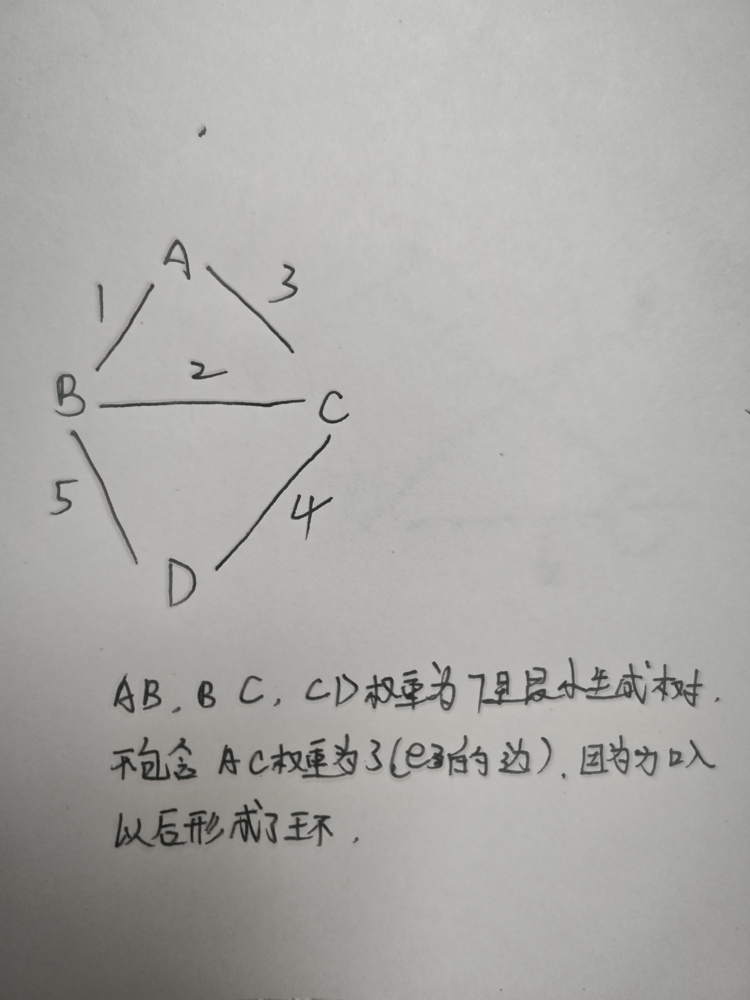

## 问题 2 
**瓶颈生成树（Bottleneck Spanning Tree）**

带有权重的无向图 $G(V,E,w)$ 的瓶颈生成树，表现为：在所有生成树中，最大权重边的权重值最小。即，BST $T$ 最小化瓶颈损失 $c(T)=max_{e \in T}{w(e)}$。

1. 证明 $G$ 的每一个最小生成树（MST）都是瓶颈生成树（BST）
2. 设计一个线性时间复杂度的算法：， 对于一个图 $G(V,E,w)$ 和一个整数 $b$，判断图 $ G$ 是否存在一个瓶颈生成树，其最大权重边的权重不超过 $b$，分析算法设计思路，并基于python编程实现。
3. 设计一个线性时间复杂度的算法：对于给定的图 $G(V,E,w)$，找到其瓶颈生成树，分析算法设计思路，并基于python编程实现。

idea1：本题借助了豆包大模型

假设 $T$ 是图 $G(V, E, w)$ 的一个最小生成树，$T'$ 是图 $G$ 的一个瓶颈生成树。设 $c(T)=\max_{e\in T}w(e)$，$c(T')=\max_{e\in T'}w(e)$。

采用反证法。假设 $T$ 不是瓶颈生成树，那么 $c(T) > c(T')$。这意味着在 $T$ 中存在一条边 $e_1$，其权重 $w(e_1)>c(T')$。

因为 $T'$ 是生成树，$T$ 也是生成树，我们可以在 $T'$ 中加入边 $e_1$，这样会形成一个环。在这个环中，一定存在一条边 $e_2$ 不在 $T$ 中（否则 $T$ 就包含环了，这与 $T$ 是树矛盾），并且 $w(e_2)\leq c(T') < w(e_1)$。

现在我们可以用 $e_2$ 替换 $e_1$ 得到一个新的生成树 $T''$，$T''$ 的总权重小于 $T$ 的总权重，这与 $T$ 是最小生成树矛盾。所以假设不成立，即每一个最小生成树都是瓶颈生成树。


idea2：我们可以使用 Kruskal 算法的思想。首先将所有边按权重从小到大排序，然后依次加入边，直到形成一个生成树。在加入边的过程中，如果遇到权重

超过 b的边，则停止加入。最后检查是否形成了一个生成树，如果形成了，则说明存在一个瓶颈生成树，其最大权重边的权重不超过 b。

In [1]:
# add your code here
# algorithm of the linear time complexity 
class UnionFind:
    def __init__(self, n):
        # 初始化每个节点的父节点为自身，用于后续构建并查集
        # 列表的索引代表节点编号，对应的值代表该节点的父节点编号
        self.parent = list(range(n))
        # 初始化每个节点的秩为 0，秩用于优化合并操作，避免树的高度过高
        # 秩可以理解为树的高度
        self.rank = [0] * n

    def find(self, x):
        # 路径压缩，将节点直接连接到根节点，减少后续查找的时间复杂度
        # 若当前节点的父节点不是自身，说明还未找到根节点
        if self.parent[x] != x:
            # 递归查找父节点的根节点，并将当前节点的父节点更新为根节点
            self.parent[x] = self.find(self.parent[x])
        # 返回当前节点的根节点
        return self.parent[x]

    def union(self, x, y):
        # 找到节点 x 所在集合的根节点
        root_x = self.find(x)
        # 找到节点 y 所在集合的根节点
        root_y = self.find(y)
        # 若两个节点的根节点不同，说明它们不在同一个集合中，需要合并
        if root_x != root_y:
            # 若节点 x 所在集合的秩大于节点 y 所在集合的秩
            if self.rank[root_x] > self.rank[root_y]:
                # 将节点 y 所在集合的根节点的父节点设为节点 x 所在集合的根节点
                self.parent[root_y] = root_x
            # 若节点 x 所在集合的秩小于节点 y 所在集合的秩
            elif self.rank[root_x] < self.rank[root_y]:
                # 将节点 x 所在集合的根节点的父节点设为节点 y 所在集合的根节点
                self.parent[root_x] = root_y
            else:
                # 若两个集合的秩相等，将节点 y 所在集合的根节点的父节点设为节点 x 所在集合的根节点
                self.parent[root_y] = root_x
                # 节点 x 所在集合的秩加 1
                self.rank[root_x] += 1
            # 合并成功，返回 True
            return True
        # 两个节点已经在同一个集合中，无需合并，返回 False
        return False

def has_bottleneck_spanning_tree(graph, b):
    # 获取图中节点的数量
    n = len(graph)
    # 初始化并查集，节点数量为 n
    uf = UnionFind(n)
    # 遍历图中的所有边
    for u in range(n):
        for v, w in graph[u]:
            # 若边的权重不超过 b
            if w <= b:
                # 合并边的两个端点所在的集合
                uf.union(u, v)
    # 找到节点 0 所在集合的根节点
    root = uf.find(0)
    # 遍历其他节点
    for i in range(1, n):
        # 若当前节点的根节点与节点 0 的根节点不同
        if uf.find(i) != root:
            # 说明图不连通，不存在满足条件的瓶颈生成树，返回 False
            return False
    # 所有节点的根节点都相同，说明图连通，存在满足条件的瓶颈生成树，返回 True
    return True

# 示例图的邻接表表示
graph = [
    [(1, 1), (2, 2)],
    [(0, 1), (2, 3)],
    [(0, 2), (1, 3)]
]
# 设定瓶颈值
b = 2
# 调用函数判断是否存在满足条件的瓶颈生成树，并打印结果
print(has_bottleneck_spanning_tree(graph, b))
    

True


idea3:

前面证明，每个最小生成树（MST）都是瓶颈生成树（BST）。所以，我们可以使用 Kruskal 算法来找到图的瓶颈生成树，因为 Kruskal 算法能够高效

地找到图的最小生成树。以下是具体步骤：

1.边排序：将图 G中所有边按照权重从小到大进行排序。

2.初始化并查集：为图中的每个顶点创建一个独立的集合，使用并查集（Union-Find）数据结构来管理这些集合，方便后续判断两个顶点是否属于同一个连通分量。

3.遍历边：按排序后的顺序依次遍历每条边。

    检查连通性：对于当前边 (u,v)，使用并查集检查顶点 u和 v是否属于不同的连通分量。

    合并集合：如果它们属于不同的连通分量，则将这条边加入到瓶颈生成树中，并使用并查集将这两个连通分量合并为一个。

4.终止条件：当加入的边数达到 ∣V∣−1条时，就得到了一个生成树，此时该生成树就是瓶颈生成树。

In [2]:
# 定义并查集类，用于处理图中顶点的连通性问题
class UnionFind:
    # 类的初始化方法，n 表示图中顶点的数量
    def __init__(self, n):
        # 初始化每个顶点的父节点为自身
        # 这里用列表来存储每个顶点的父节点信息，列表索引对应顶点编号
        self.parent = list(range(n))
        # 初始化每个顶点的秩为 0，秩用于优化合并操作
        # 秩可以简单理解为树的高度，用于在合并时避免树的高度增长过快
        self.rank = [0] * n

    # 查找顶点 x 所在集合的根节点，并进行路径压缩
    def find(self, x):
        # 路径压缩，让查找操作的时间复杂度接近常数
        # 如果当前顶点的父节点不是自身，说明还没找到根节点
        if self.parent[x] != x:
            # 递归查找父节点的根节点，并将当前顶点的父节点更新为根节点
            self.parent[x] = self.find(self.parent[x])
        # 返回当前顶点所在集合的根节点
        return self.parent[x]

    # 合并顶点 x 和顶点 y 所在的集合
    def union(self, x, y):
        # 找到顶点 x 所在集合的根节点
        root_x = self.find(x)
        # 找到顶点 y 所在集合的根节点
        root_y = self.find(y)
        # 如果两个顶点所在集合的根节点不同，说明它们不在同一个集合中，需要合并
        if root_x != root_y:
            # 如果顶点 x 所在集合的秩大于顶点 y 所在集合的秩
            if self.rank[root_x] > self.rank[root_y]:
                # 将顶点 y 所在集合的根节点的父节点设为顶点 x 所在集合的根节点
                self.parent[root_y] = root_x
            # 如果顶点 x 所在集合的秩小于顶点 y 所在集合的秩
            elif self.rank[root_x] < self.rank[root_y]:
                # 将顶点 x 所在集合的根节点的父节点设为顶点 y 所在集合的根节点
                self.parent[root_x] = root_y
            # 如果两个集合的秩相等
            else:
                # 将顶点 y 所在集合的根节点的父节点设为顶点 x 所在集合的根节点
                self.parent[root_y] = root_x
                # 顶点 x 所在集合的秩加 1
                self.rank[root_x] += 1
            # 合并成功，返回 True
            return True
        # 两个顶点已经在同一个集合中，无需合并，返回 False
        return False

# 定义函数，用于找到图的瓶颈生成树
def find_bottleneck_spanning_tree(graph):
    # 获取图中顶点的数量
    n = len(graph)
    # 用于存储图中的所有边
    edges = []
    # 提取图中的所有边
    # 遍历图中的每个顶点
    for u in range(n):
        # 遍历当前顶点的所有邻接顶点及其对应的边的权重
        for v, w in graph[u]:
            # 避免重复添加边，只处理 u < v 的情况
            if u < v:
                # 将边的信息（权重、起点、终点）添加到 edges 列表中
                edges.append((w, u, v))
    # 按边的权重从小到大排序
    edges.sort()

    # 初始化并查集，用于处理顶点的连通性
    uf = UnionFind(n)
    # 用于存储瓶颈生成树的边
    mst = []
    # 遍历排序后的边
    for w, u, v in edges:
        # 如果将边 (u, v) 加入后能合并两个不同的集合
        if uf.union(u, v):
            # 将该边加入到瓶颈生成树中
            mst.append((u, v, w))
            # 当生成树中的边数达到 n - 1 条时，说明已经找到了瓶颈生成树，退出循环
            if len(mst) == n - 1:
                break
    # 返回找到的瓶颈生成树的边
    return mst

# 示例图的邻接表表示
graph = [
    [(1, 1), (2, 2)],
    [(0, 1), (2, 3)],
    [(0, 2), (1, 3)]
]

# 调用函数找到瓶颈生成树
bottleneck_spanning_tree = find_bottleneck_spanning_tree(graph)
# 打印找到的瓶颈生成树的边
print("瓶颈生成树的边:", bottleneck_spanning_tree)
    

瓶颈生成树的边: [(0, 1, 1), (0, 2, 2)]


## 问题 3

**道路网（Road Network）**

假设有一个以图 $ G(V, E, l) $ 表示的道路网络，连接了一组城市 $ V $。我们假设该网络是有向的，并且每条道路 $(u, v) \in E$ 都有一个非负的长度 $ l(u, v) $。一条新的道路即将被建造，因此有一个列表 $ E' $ 包含它可以连接的城市对。每对 $(u, v) \in E'$ 都有一个对应的长度 $ l'(u, v) $。我们希望选择一对城市，使得两个城市 $ s, t \in V $ 之间的距离减少最大。请为此问题编写一个高效的算法，并详细解释算法的正确性和复杂度。


idea: 

**算法设计思路**

为了解决选择一对新道路来最大程度减少两个城市 s和 t之间距离的问题，可以采用以下步骤设计算法：

1.初始最短路径计算：使用 Floyd - Warshall 算法计算在添加任何新道路之前，图中任意两个城市之间的最短路径。Floyd - Warshall 算法的时间复杂度

为 O(V3)，可以处理有向图，能得到任意两点间的最短路径矩阵。

2.尝试添加新道路：遍历新道路列表 E ′中的每一条新道路，对于每条新道路(u,v)，更新最短路径矩阵。具体做法是检查通过新道路 (u,v)是否能缩短某些

城市对之间的最短路径。

3.选择最优新道路：记录下每一条新道路添加后，两个城市 s和 t之间距离减少的最大值，并记录对应的新道路。

**Floyd - Warshall 算法的正确性**

Floyd - Warshall 算法通过动态规划的思想，逐步考虑所有可能的中间节点，更新任意两点之间的最短路径。对于每一个中间节点 k，算法会检查是否通过 

k可以缩短从i到j的路径。因为考虑了所有可能的中间节点，最终得到的矩阵包含了任意两点之间的最短路径。

尝试添加新道路的正确性：对于新道路列表 E ′中的每一条新道路(u,v)，我们通过更新最短路径矩阵来检查它对所有城市对之间最短路径的影响。由于我们

遍历了所有可能的新道路，并且对每一条新道路都重新计算了最短路径，所以最终能找到使两个城市之间距离减少最大的新道路。

In [3]:
def floyd_warshall(graph, V):
    # 初始化距离矩阵
    dist = [[float('inf')] * V for _ in range(V)]
    for i in range(V):
        dist[i][i] = 0
    for u in range(V):
        for v, w in graph[u]:
            dist[u][v] = w

    # Floyd - Warshall 算法核心
    for k in range(V):
        for i in range(V):
            for j in range(V):
                if dist[i][k] != float('inf') and dist[k][j] != float('inf'):
                    dist[i][j] = min(dist[i][j], dist[i][k] + dist[k][j])

    return dist

def find_best_new_road(graph, new_roads, s, t):
    V = len(graph)
    # 计算初始最短路径矩阵
    initial_dist = floyd_warshall(graph, V)
    initial_distance = initial_dist[s][t]

    max_reduction = 0
    best_road = None

    # 尝试添加每一条新道路
    for u, v, l_prime in new_roads:
        # 复制初始距离矩阵
        new_dist = [row[:] for row in initial_dist]
        # 更新新道路的距离
        new_dist[u][v] = min(new_dist[u][v], l_prime)

        # 重新运行 Floyd - Warshall 算法更新最短路径
        for k in range(V):
            for i in range(V):
                for j in range(V):
                    if new_dist[i][k] != float('inf') and new_dist[k][j] != float('inf'):
                        new_dist[i][j] = min(new_dist[i][j], new_dist[i][k] + new_dist[k][j])

        # 计算新的最短距离
        new_distance = new_dist[s][t]
        # 计算距离减少量
        reduction = initial_distance - new_distance

        # 更新最大减少量和最佳道路
        if reduction > max_reduction:
            max_reduction = reduction
            best_road = (u, v)

    return best_road, max_reduction

# 示例图的邻接表表示
graph = [
    [(1, 1), (2, 2)],
    [(2, 3)],
    []
]

# 新道路列表
new_roads = [
    (0, 2, 1),
    (1, 2, 2)
]

# 起点和终点
s = 0
t = 2

best_road, max_reduction = find_best_new_road(graph, new_roads, s, t)
print("最佳新道路:", best_road)
print("最大距离减少量:", max_reduction)

# 
# 时间复杂度：Floyd - Warshall 算法的时间复杂度为 O(V^3 )，用于计算初始的最短路径矩阵。遍历新道路列表 E ′，对于每一条新道路，
# 需要更新最短路径矩阵，更新操作的时间复杂度为 O(V^2 )。假设新道路列表的长度为 ∣E′∣，则这部分的时间复杂度为 O(∣E′∣*V^2)。
# 因此，总的时间复杂度为 O(V^3)+∣E′∣V^2)。

#空间复杂度：主要用于存储最短路径矩阵，空间复杂度为 O(V^2)。

最佳新道路: (0, 2)
最大距离减少量: 1


## 问题 4

**逃离问题**

一个 $ n \times n $ 的网格是一个无向图，由 $ n $ 行和 $ n $ 列的顶点组成，如下图所示。我们用 $(i,j)$ 表示第 $ i $ 行和第 $ j $ 列的顶点。除了边界顶点，网格中的所有顶点都有四个邻居，即满足 $ i = 1, i = n, j = 1 $ 或 $ j = n $ 的点 $(i,j)$。

给定网格中的 $ m \leq n^2 $ 个起点 $(x_1, y_1), (x_2, y_2), \cdots , (x_m, y_m)$，逃离问题是确定是否存在 $ m $ 条顶点不相交的路径（即路径之间不相交），从这些起点到边界上的任意 $ m $ 个不同点。例如，图1中的网格存在逃离。

(1) 该问题可以看作是一个最大流问题。考虑一个流网络，其中顶点和边都有容量。也就是说，进入任何给定顶点的总正流量受到容量限制。证明在具有边和顶点容量的网络中确定最大流可以简化为在具有可比大小的普通流网络上的最大流问题。更准确地说，你需要将一个具有顶点和边容量的网络 $ G = (V,E) $ 转换为另一个仅具有边容量的网络 $ G' = (V', E') $，使得两个网络上的最大流相同，并且你构建的新网络具有 $ V' = O(V) $ 个顶点和 $ E' = O(E) $ 条边。你可以假设网络是连通的。

(2) 描述一个解决逃离问题的高效算法，并分析其运行时间。


<div align="center"> <img alt="图片" src="./fig/escepe-p.png"> </div>
<center> 图2. 逃脱问题网格，起始顶点为黑色，其他网格顶点为白色</center>

idea:

### 参考大模型的思路，自己复现代码，然后参考大模型的具体代码，对比修改实现。
### (1) 将具有顶点和边容量的网络转换为仅具有边容量的网络

#### 转换思路
对于一个具有顶点和边容量的网络 \(N=(V, E, c_v, c_e)\)，其中 \(c_v: V \to \mathbb{R}^+\) 是顶点容量函数，\(c_e: E \to \mathbb{R}^+\) 是边容量函数。我们要将其转换为一个仅具有边容量的网络 \(N'=(V', E', c_{e}')\)，使得两个网络上的最大流相同。

具体做法是，对于网络 \(N\) 中的每个顶点 \(v \in V\)，我们将其拆分为两个顶点 \(v_{in}\) 和 \(v_{out}\)，并在它们之间添加一条有向边 \((v_{in}, v_{out})\)，该边的容量设置为顶点 \(v\) 的容量 \(c_v(v)\)。同时，原本进入顶点 \(v\) 的边改为进入 \(v_{in}\)，原本从顶点 \(v\) 出去的边改为从 \(v_{out}\) 出去，这些边的容量保持不变。

#### 转换过程
设原网络 \(N\) 有 \(n\) 个顶点和 \(m\) 条边。
- **顶点转换**：对于每个顶点 \(v \in V\)，创建两个新顶点 \(v_{in}\) 和 \(v_{out}\)，所以新网络 \(N'\) 的顶点数 \(|V'| = 2n\)。
- **边转换**：
    - 对于原网络中的每条边 \((u, v) \in E\)，在新网络中添加边 \((u_{out}, v_{in})\)，其容量为 \(c_e(u, v)\)。这样的边有 \(m\) 条。
    - 对于每个顶点 \(v \in V\)，添加边 \((v_{in}, v_{out})\)，其容量为 \(c_v(v)\)。这样的边有 \(n\) 条。所以新网络 \(N'\) 的边数 \(|E'| = m + n\)。

#### 正确性证明
- **流量守恒**：在原网络中，进入顶点 \(v\) 的总流量不能超过 \(c_v(v)\)。在新网络中，由于从 \(v_{in}\) 到 \(v_{out}\) 的边容量为 \(c_v(v)\)，所以进入 \(v_{in}\) 的总流量也不能超过 \(c_v(v)\)，从而保证了流量守恒。
- **最大流相等**：由于新网络的构造方式，原网络中的任何一个可行流都可以在新网络中找到对应的可行流，反之亦然。因此，两个网络的最大流是相同的。

### (2) 解决逃离问题的高效算法及运行时间分析

#### 算法思路
把可以将逃离问题转化为一个最大流问题。具体步骤如下：
1. **构建流网络**：
    - **顶点**：对于网格中的每个顶点 \((i, j)\)，将其拆分为 \((i, j)_{in}\) 和 \((i, j)_{out}\)，同时添加源点 \(s\) 和汇点 \(t\)。
    - **边及容量**：
        - 对于每个顶点 \((i, j)\)，添加边 \(((i, j)_{in}, (i, j)_{out})\)，容量为 \(1\)，表示每个顶点最多只能被一条路径使用一次。
        - 对于网格中的相邻顶点 \((i, j)\) 和 \((i', j')\)，添加边 \(((i, j)_{out}, (i', j')_{in})\)，容量为 \(1\)，表示相邻顶点之间的路径容量为 \(1\)。
        - 从源点 \(s\) 到每个起点 \(p_k\) 的 \(p_{k_{in}}\) 添加边 \((s, p_{k_{in}})\)，容量为 \(1\)。
        - 对于边界上的每个顶点 \((i, j)\)，添加边 \(((i, j)_{out}, t)\)，容量为 \(1\)。
2. **计算最大流**：使用 Ford - Fulkerson 算法或其改进算法（如 Edmonds - Karp 算法）计算从源点 \(s\) 到汇点 \(t\) 的最大流。
3. **判断是否存在逃离路径**：如果最大流等于起点的数量 \(k\)，则说明存在 \(k\) 条顶点不相交的路径从起点到边界上的不同点；否则，不存在。

#### 运行时间分析
- **构建流网络**：网格有 \(r \times c\) 个顶点，构建流网络的时间复杂度为 \(O(r \times c)\)。
- **计算最大流**：使用 Edmonds - Karp 算法计算最大流，其时间复杂度为 \(O(V E^2)\)，其中 \(V = 2rc + 2\)（\(2rc\) 是拆分后的顶点数，\(2\) 是源点和汇点），\(E = O(rc)\)（边的数量与顶点数量成正比）。所以计算最大流的时间复杂度为 \(O((rc)^3)\)。

因此，解决逃离问题的总时间复杂度为 \(O((rc)^3)\)。

In [4]:
from collections import deque

# Ford - Fulkerson 算法的改进版 Edmonds - Karp 算法
# 广度优先搜索函数，用于在残量网络中寻找从源点 s 到汇点 t 的增广路径
def bfs(residual_graph, s, t, parent):
    # 初始化所有顶点为未访问状态
    visited = [False] * len(residual_graph)
    # 使用双端队列来进行 BFS
    queue = deque()
    # 将源点加入队列
    queue.append(s)
    # 标记源点为已访问
    visited[s] = True

    # 当队列不为空时
    while queue:
        # 从队列中取出一个顶点
        u = queue.popleft()
        # 遍历该顶点的所有邻接顶点
        for ind, val in enumerate(residual_graph[u]):
            # 如果邻接顶点未被访问且边的容量大于 0
            if not visited[ind] and val > 0:
                # 将邻接顶点加入队列
                queue.append(ind)
                # 标记邻接顶点为已访问
                visited[ind] = True
                # 记录该邻接顶点的前一个顶点
                parent[ind] = u
                # 如果邻接顶点是汇点，说明找到了增广路径
                if ind == t:
                    return True
    # 未找到增广路径
    return False

# Edmonds - Karp 算法，用于计算从源点 s 到汇点 t 的最大流
def edmonds_karp(graph, s, t):
    # 复制图得到残量网络，初始时残量网络等于原图
    residual_graph = [row[:] for row in graph]
    # 初始化每个顶点的前一个顶点为 -1
    parent = [-1] * len(graph)
    # 初始化最大流为 0
    max_flow = 0

    # 不断寻找增广路径
    while bfs(residual_graph, s, t, parent):
        # 初始化增广路径上的最小容量为无穷大
        path_flow = float('Inf')
        # 从汇点开始回溯，使用临时变量 current 避免与源点 s 冲突
        current = t
        while current != s:
            # 找到增广路径上的最小容量
            path_flow = min(path_flow, residual_graph[parent[current]][current])
            # 回溯到前一个顶点
            current = parent[current]
        # 最大流加上增广路径上的最小容量
        max_flow += path_flow
        # 从汇点开始更新残量网络
        current = t
        while current != s:
            prev = parent[current]
            # 正向边的容量减去增广路径上的最小容量
            residual_graph[prev][current] -= path_flow
            # 反向边的容量加上增广路径上的最小容量
            residual_graph[current][prev] += path_flow
            # 回溯到前一个顶点
            current = parent[current]
    # 返回最大流
    return max_flow

# 解决逃离问题的函数
def escape_problem(r, c, start_points):
    # 计算图中顶点的总数，包括拆分后的顶点和源点、汇点
    num_vertices = 2 * r * c + 2
    # 源点的编号
    source = num_vertices - 2
    # 汇点的编号
    sink = num_vertices - 1

    # 初始化图，所有边的容量初始化为 0
    graph = [[0] * num_vertices for _ in range(num_vertices)]

    # 添加顶点容量边，每个顶点拆分为入顶点和出顶点，边容量为 1
    for i in range(r):
        for j in range(c):
            # 入顶点的编号
            in_vertex = i * c + j
            # 出顶点的编号
            out_vertex = r * c + i * c + j
            # 设置入顶点到出顶点的边容量为 1
            graph[in_vertex][out_vertex] = 1

    # 添加相邻顶点之间的边，边容量为 1
    for i in range(r):
        for j in range(c):
            # 当前顶点的出顶点编号
            out_vertex = r * c + i * c + j
            # 检查上方相邻顶点
            if i > 0:
                # 上方相邻顶点的入顶点编号
                neighbor_in_vertex = (i - 1) * c + j
                # 设置当前顶点出顶点到上方相邻顶点入顶点的边容量为 1
                graph[out_vertex][neighbor_in_vertex] = 1
            # 检查下方相邻顶点
            if i < r - 1:
                # 下方相邻顶点的入顶点编号
                neighbor_in_vertex = (i + 1) * c + j
                # 设置当前顶点出顶点到下方相邻顶点入顶点的边容量为 1
                graph[out_vertex][neighbor_in_vertex] = 1
            # 检查左方相邻顶点
            if j > 0:
                # 左方相邻顶点的入顶点编号
                neighbor_in_vertex = i * c + j - 1
                # 设置当前顶点出顶点到左方相邻顶点入顶点的边容量为 1
                graph[out_vertex][neighbor_in_vertex] = 1
            # 检查右方相邻顶点
            if j < c - 1:
                # 右方相邻顶点的入顶点编号
                neighbor_in_vertex = i * c + j + 1
                # 设置当前顶点出顶点到右方相邻顶点入顶点的边容量为 1
                graph[out_vertex][neighbor_in_vertex] = 1

    # 添加源点到起点的边，边容量为 1
    for i, j in start_points:
        # 起点的入顶点编号
        in_vertex = i * c + j
        # 设置源点到起点入顶点的边容量为 1
        graph[source][in_vertex] = 1

    # 添加边界顶点到汇点的边，边容量为 1
    for i in range(r):
        for j in range(c):
            # 判断是否为边界顶点
            if i == 0 or i == r - 1 or j == 0 or j == c - 1:
                # 边界顶点的出顶点编号
                out_vertex = r * c + i * c + j
                # 设置边界顶点出顶点到汇点的边容量为 1
                graph[out_vertex][sink] = 1

    # 调用 Edmonds - Karp 算法计算最大流
    max_flow = edmonds_karp(graph, source, sink)
    # 判断最大流是否等于起点的数量，如果相等则存在逃离路径
    return max_flow == len(start_points)

# 示例用法
# 网格的行数
r = 3
# 网格的列数
c = 3
# 起点列表
start_points = [(1, 1)]
# 调用函数并打印结果
print(escape_problem(r, c, start_points))

True
